# EDA
Author: Raziel Amador Rios    
Oc 4th 2022

In [1]:
# General modules:
import os
import time
import itertools
import warnings
warnings.filterwarnings("ignore")
# Date-related modules:
import calendar as cal
from datetime import datetime, timedelta
# Data manipulation:
import pandas as pd
import numpy as np
# Plot modules:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
from IPython.display import display
# Time-series related:
from scipy.signal import periodogram
from statsmodels.tsa.stattools import pacf, acf
from statsmodels.tsa.seasonal import seasonal_decompose, DecomposeResult
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from statsmodels.graphics.tsaplots import month_plot

In [2]:
# Plot configs:
sns.set_context("paper", font_scale= 1.5)
plt.rcParams['axes.spines.right']= False
plt.rcParams['axes.spines.top']= False
# Pandas config
pd.options.display.float_format= '{:,.4f}'.format
# Plotly configs:
pio.templates.default = "simple_white"
plotly_base_params = {
    'template': "plotly_white",
    'title_font': dict(size=29, color='#8a8d93', family="Lato, sans-serif"),
    'font': dict(color='#8a8d93'), 
    'hoverlabel': dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif")
}

In [3]:
DATA_DIR = "../data/raw_data/"

train = pd.read_csv(os.path.join(DATA_DIR, "train.csv"), parse_dates=['date'])
test = pd.read_csv(os.path.join(DATA_DIR, "test.csv"), parse_dates=['date'])
oil = pd.read_csv(os.path.join(DATA_DIR, "oil.csv"), parse_dates=['date'])
holidays_events = pd.read_csv(os.path.join(DATA_DIR, "holidays_events.csv"), parse_dates=['date'])
transactions = pd.read_csv(os.path.join(DATA_DIR, "transactions.csv"), parse_dates=['date'])
stores = pd.read_csv(os.path.join(DATA_DIR, "stores.csv"))

print(f"Training Data: from {train.date.min()} to {train.date.max()} - {train.date.max() - train.date.min()}")
print(f"Testing Data: from {test.date.min()} to {test.date.max()} - {test.date.max() - test.date.min()}")

Training Data: from 2013-01-01 00:00:00 to 2017-08-15 00:00:00 - 1687 days 00:00:00
Testing Data: from 2017-08-16 00:00:00 to 2017-08-31 00:00:00 - 15 days 00:00:00


In [4]:
print(train.info())
train.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float64       
 5   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 137.4+ MB
None


,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0000,0
1,1,2013-01-01,1,BABY CARE,0.0000,0
2,2,2013-01-01,1,BEAUTY,0.0000,0
3,3,2013-01-01,1,BEVERAGES,0.0000,0
4,4,2013-01-01,1,BOOKS,0.0000,0


In [5]:
print(test.info())
test.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           28512 non-null  int64         
 1   date         28512 non-null  datetime64[ns]
 2   store_nbr    28512 non-null  int64         
 3   family       28512 non-null  object        
 4   onpromotion  28512 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 1.1+ MB
None


,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [6]:
# calendar dataset covering train + test dates
calendar = pd.DataFrame(index=pd.date_range(train.date.min(), test.date.max()))

# days of week
# Monday == 0; Sunday == 6
calendar['weekday'] = calendar.index.dayofweek 
calendar

,weekday
2013-01-01,1
2013-01-02,2
2013-01-03,3
2013-01-04,4
2013-01-05,5
...,...
2017-08-27,6
2017-08-28,0
2017-08-29,1
2017-08-30,2


# EDA

In [7]:
# Merge train with stores, transactions, 
train_ext = train.merge(stores, on='store_nbr', how='left')
train_ext = train_ext.merge(transactions, on=['date', 'store_nbr'], how='left')
train_ext = train_ext.rename(columns={"type": "store_type"})
train_ext

,id,date,store_nbr,family,sales,onpromotion,city,state,store_type,cluster,transactions
0,0,2013-01-01,1,AUTOMOTIVE,0.0000,0,Quito,Pichincha,D,13,NaN
1,1,2013-01-01,1,BABY CARE,0.0000,0,Quito,Pichincha,D,13,NaN
2,2,2013-01-01,1,BEAUTY,0.0000,0,Quito,Pichincha,D,13,NaN
3,3,2013-01-01,1,BEVERAGES,0.0000,0,Quito,Pichincha,D,13,NaN
4,4,2013-01-01,1,BOOKS,0.0000,0,Quito,Pichincha,D,13,NaN
...,...,...,...,...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.1330,0,Quito,Pichincha,B,6,"2,155.0000"
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.5530,1,Quito,Pichincha,B,6,"2,155.0000"
3000885,3000885,2017-08-15,9,PRODUCE,"2,419.7290",148,Quito,Pichincha,B,6,"2,155.0000"
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.0000,8,Quito,Pichincha,B,6,"2,155.0000"


In [10]:
# Parsing dates
train_ext['date'] = train_ext['date'].astype('datetime64[ns]')
train_ext['year'] = train_ext['date'].dt.year
train_ext['month'] = train_ext['date'].dt.month
train_ext['week'] = train_ext['date'].dt.isocalendar().week
train_ext['quarter'] = train_ext['date'].dt.quarter
train_ext['weekday'] = train_ext['date'].dt.dayofweek
train_ext['day_name'] = train_ext['date'].dt.day_name()
# Print results
print(f"Extended training data: {len(train_ext):,.2f}")
train_ext

Extended training data: 3,000,888.00


,id,date,store_nbr,family,sales,onpromotion,city,state,store_type,cluster,transactions,year,month,week,quarter,weekday,day_name
0,0,2013-01-01,1,AUTOMOTIVE,0.0000,0,Quito,Pichincha,D,13,NaN,2013,1,1,1,1,Tuesday
1,1,2013-01-01,1,BABY CARE,0.0000,0,Quito,Pichincha,D,13,NaN,2013,1,1,1,1,Tuesday
2,2,2013-01-01,1,BEAUTY,0.0000,0,Quito,Pichincha,D,13,NaN,2013,1,1,1,1,Tuesday
3,3,2013-01-01,1,BEVERAGES,0.0000,0,Quito,Pichincha,D,13,NaN,2013,1,1,1,1,Tuesday
4,4,2013-01-01,1,BOOKS,0.0000,0,Quito,Pichincha,D,13,NaN,2013,1,1,1,1,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.1330,0,Quito,Pichincha,B,6,"2,155.0000",2017,8,33,3,1,Tuesday
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.5530,1,Quito,Pichincha,B,6,"2,155.0000",2017,8,33,3,1,Tuesday
3000885,3000885,2017-08-15,9,PRODUCE,"2,419.7290",148,Quito,Pichincha,B,6,"2,155.0000",2017,8,33,3,1,Tuesday
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.0000,8,Quito,Pichincha,B,6,"2,155.0000",2017,8,33,3,1,Tuesday


In [11]:
def print_summary(data:dict, title):
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x = np.arange(start=0, stop=len(data)),
        y = np.full(len(data), 1.6),
        mode = "text", 
        text = [f"<span style='font-size:33px'><b>{data[x]}</b></span>" for x in data],
        textposition = "bottom center",
        hoverinfo = 'skip'
    ))
    fig.add_trace(go.Scatter(
        x = np.arange(start=0, stop=len(data)),
        y = np.full(len(data), 1.1),
        mode = "text", 
        text = [x for x in data],
        textposition = "bottom center",
        hoverinfo = 'skip'
    ))
    fig.add_hline(y=2.2, line_width=5, line_color='gray')
    fig.add_hline(y=0.3, line_width=3, line_color='gray')
    fig.update_yaxes(visible=False)
    fig.update_xaxes(visible=False)
    fig.update_layout(
        showlegend=False, height=300, width=1200,
        title=title, title_x=0.5, title_y=0.9,
        yaxis_range=[-0.2,2.2],
        plot_bgcolor='#fafafa', paper_bgcolor='#fafafa',
        font=dict(size=23, color='#323232'),
        title_font=dict(size=35, color='#222'),
        margin=dict(t=90,l=70,b=0,r=70)
    )
    fig.show(config={'staticPlot': False})

In [12]:
# compute number of months
start_date = train_ext.date.min()
end_date = train_ext.date.max()
nb_months = round((end_date.year - start_date.year) * 12 + (end_date.month - start_date.month) + (end_date.day / 30.5), 1)
print(nb_months)

55.5


## 1.1) Stores summary

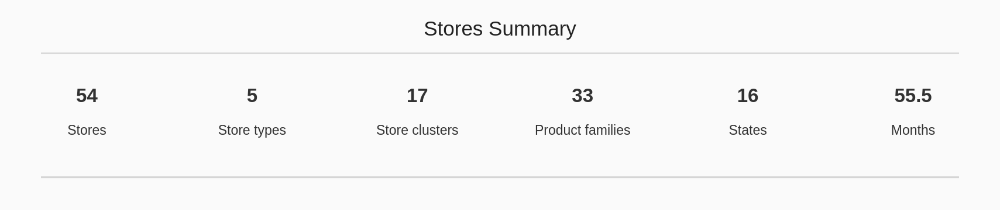

In [13]:
summary = {
    "Stores": stores.shape[0],
    "Store types": train_ext.store_type.nunique(),
    "Store clusters": train_ext.cluster.nunique(),
    "Product families": train_ext.family.nunique(),
    "States": train_ext.state.nunique(),
    "Months": nb_months
}
print_summary(summary, "Stores Summary")

In [14]:
# store_type
df_st_sa = train_ext.groupby('store_type').agg({"sales" : "mean"}).sort_values(by='sales', ascending=False).reset_index()
display(df_st_sa)

# Product-family top 10
df_fa_sa = train_ext.groupby('family').agg({"sales" : "mean"}).sort_values(by='sales', ascending=False)[:10].reset_index()
df_fa_sa['percent'] = round((df_fa_sa['sales'] / df_fa_sa['sales'].sum()) * 100, 1)
df_fa_sa['percent'] = df_fa_sa['percent'].astype(str) + "%"
df_fa_sa['color'] = '#c6ccd8'
df_fa_sa['color'].at[df_fa_sa.sales.idxmax()] = '#496595' # highest value color
display(df_fa_sa)

# By cluster
df_cl_sa = train_ext.groupby('cluster').agg({"sales" : "mean"}).reset_index()
df_cl_sa['percent'] = round((df_cl_sa['sales'] / df_cl_sa['sales'].sum()) * 100, 1)
df_cl_sa['percent'] = df_cl_sa['percent'].astype(str) + "%"
df_cl_sa['color'] = '#c6ccd8'
df_cl_sa['color'].at[df_cl_sa.sales.idxmax()] = '#496595'
display(df_cl_sa)

,store_type,sales
0,A,705.8787
1,D,350.9794
2,B,326.7397
3,E,269.1213
4,C,197.2633


,family,sales,percent,color
0,GROCERY I,"3,776.9721",34.4%,#496595
1,BEVERAGES,"2,385.7932",21.7%,#c6ccd8
2,PRODUCE,"1,349.3521",12.3%,#c6ccd8
3,CLEANING,"1,072.4167",9.8%,#c6ccd8
4,DAIRY,709.1549,6.5%,#c6ccd8
5,BREAD/BAKERY,463.3363,4.2%,#c6ccd8
6,POULTRY,350.5323,3.2%,#c6ccd8
7,MEATS,341.8500,3.1%,#c6ccd8
8,PERSONAL CARE,270.4325,2.5%,#c6ccd8
9,DELI,265.1351,2.4%,#c6ccd8


,cluster,sales,percent,color
0,1,326.1640,4.8%,#c6ccd8
1,2,260.1706,3.8%,#c6ccd8
2,3,194.4163,2.8%,#c6ccd8
3,4,296.5729,4.3%,#c6ccd8
4,5,"1,117.2453",16.3%,#496595
5,6,342.6617,5.0%,#c6ccd8
6,7,139.2619,2.0%,#c6ccd8
7,8,647.3779,9.5%,#c6ccd8
8,9,274.9683,4.0%,#c6ccd8
9,10,255.8975,3.7%,#c6ccd8


## 1.2) Family-product, store-cluster, and store-type

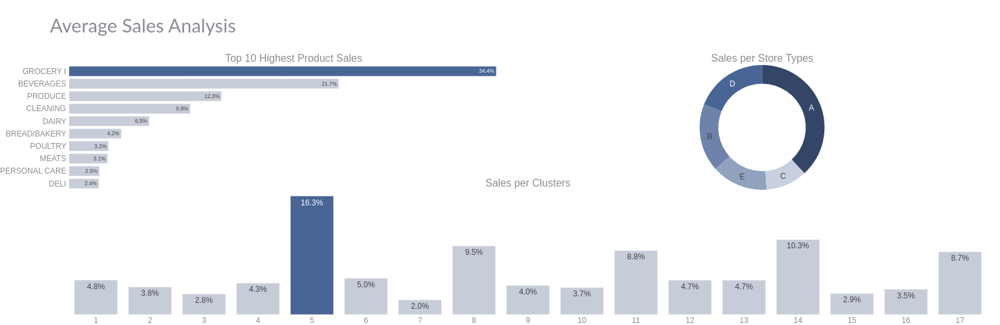

In [15]:
# charts
fig = make_subplots(rows=2, cols=2,
                    column_widths=[0.5, 0.5], vertical_spacing=0, horizontal_spacing=0.02,
                    specs=[[{"type": "bar"}, {"type": "pie"}], [{"colspan": 2}, None]],
                    subplot_titles=("Top 10 Highest Product Sales", "Sales per Store Types", "Sales per Clusters"))
fig.add_trace(go.Bar(x=df_fa_sa['sales'], y=df_fa_sa['family'], text=df_fa_sa['percent'],
                     marker=dict(color=df_fa_sa['color']), name='Family', orientation='h'),
              row=1, col=1)
fig.add_trace(go.Pie(values=df_st_sa['sales'], labels=df_st_sa['store_type'],
                     name='Store type', hole=0.7,
                     marker=dict(colors=['#334668','#496595','#6D83AA','#91A2BF','#C8D0DF']),
                     hoverinfo='label+percent+value', textinfo='label'),
              row=1, col=2)
fig.add_trace(go.Bar(x=df_cl_sa['cluster'], y=df_cl_sa['sales'], text=df_cl_sa['percent'],
                     marker=dict(color=df_cl_sa['color']), name='Cluster'), 
              row=2, col=1)

# styling
fig.update_yaxes(showgrid=False, ticksuffix=' ', categoryorder='total ascending', row=1, col=1)
fig.update_xaxes(visible=False, row=1, col=1)
fig.update_xaxes(tickmode = 'array', tickvals=df_cl_sa.cluster, ticktext=[i for i in range(1,17)], row=2, col=1)
fig.update_yaxes(visible=False, row=2, col=1)
fig.update_layout(height=500, width=1000, bargap=0.2,
                  margin=dict(b=0,r=20,l=20), xaxis=dict(tickmode='linear'),
                  title_text="Average Sales Analysis",
                  showlegend=False, **plotly_base_params)
fig.show()

### Moving Avergage
Moving Average Smoothing for Data Preparation: remove the fine-grained variation between time steps

In [16]:
# Create df_sales from trainng_df
df_sales = train.groupby('date').agg({"sales" : "sum"}).reset_index()
df_sales['sales_ma'] = df_sales['sales'].rolling(7).mean()

display(df_sales.head(7))

# Create trans
df_trans = train_ext.groupby('date').agg({"transactions" : "sum"}).reset_index()
df_trans['transactions_ma'] = df_trans['transactions'].rolling(7).mean()

display(df_trans.head(7))

,date,sales,sales_ma
0,2013-01-01,"2,511.6190",NaN
1,2013-01-02,"496,092.4179",NaN
2,2013-01-03,"361,461.2311",NaN
3,2013-01-04,"354,459.6771",NaN
4,2013-01-05,"477,350.1212",NaN
5,2013-01-06,"519,695.4011",NaN
6,2013-01-07,"336,122.8011","363,956.1812"


,date,transactions,transactions_ma
0,2013-01-01,"25,410.0000",NaN
1,2013-01-02,"3,076,095.0000",NaN
2,2013-01-03,"2,590,632.0000",NaN
3,2013-01-04,"2,590,302.0000",NaN
4,2013-01-05,"3,087,909.0000",NaN
5,2013-01-06,"2,985,312.0000",NaN
6,2013-01-07,"2,494,701.0000","2,407,194.4286"


## 1.3) Target time-series

In [18]:
# Functions:
def stationarityPlot(y: pd.DataFrame, *, lags= None, figsize= (20,10), ylabel: str="", grid_param: bool=True):
    """
    Plot time-series, its ACF and PACF, and calculate Dickey-Fuller test
    Inputs:
        y: timeseries
        lags: how many lags to include in ACF, and PACF
    Dickey-Fuller Hypothesis:
        Null-hypothesis: The series is non-stationary
        Alternative-hypothesis: The series is stationary
    Appendix:
        Nice-way to visualize:
        pd.DataFrame(df['ts']).set_index(df['date'])['ts']
    """    
    import statsmodels.api as sm
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    fig= plt.figure(figsize= figsize)
    layout= (2,2)
    ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
    acf_ax = plt.subplot2grid(layout, (1, 0))
    pacf_ax = plt.subplot2grid(layout, (1, 1))
    
    y.plot(marker='o', ax= ts_ax)
    p_value = sm.tsa.stattools.adfuller(y)[1]
    if p_value < 0.05:
        conclusion= 'The series is stationary'
    else:
        conclusion= 'The series is non-stationary'
    ts_ax.set_ylabel(ylabel)
    ts_ax.set_xlabel("")
    ts_ax.set_title(f'Dickey-Fuller p-value= {p_value:.4f} ({conclusion})')
    plot_acf(y, lags= lags, ax= acf_ax)
    plot_pacf(y, lags= lags, ax= pacf_ax)
    if grid_param:
        ts_ax.grid()
    plt.tight_layout()

In [19]:
# stationarityPlot(y=df_sales['sales'])

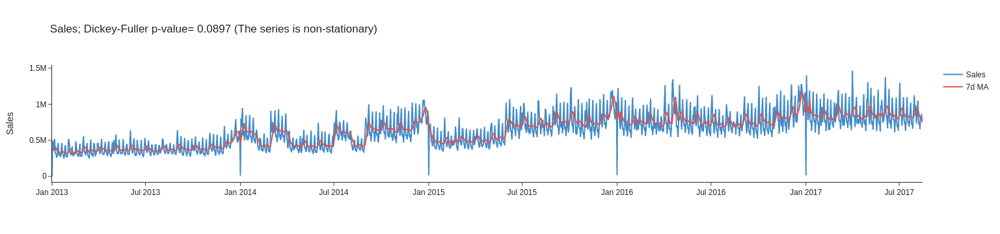

In [17]:
# fig = make_subplots(rows=1, cols=1,
#                     subplot_titles=["Sales Dickey-Fuller p-value= 0.0897 (The series is non-stationary)"],
#                     vertical_spacing=.1)

fig= go.Figure()

fig.add_scatter(x=df_sales['date'], y=df_sales['sales'],
                mode='lines', marker=dict(color='#428bca'),
                name='Sales')
fig.add_scatter(x=df_sales['date'], y=df_sales['sales_ma'],
                mode='lines', marker=dict(color='#d9534f'),
                name='7d MA')

fig.update_layout(title= f"Sales; Dickey-Fuller p-value= 0.0897 (The series is non-stationary)", yaxis_title= "Sales")

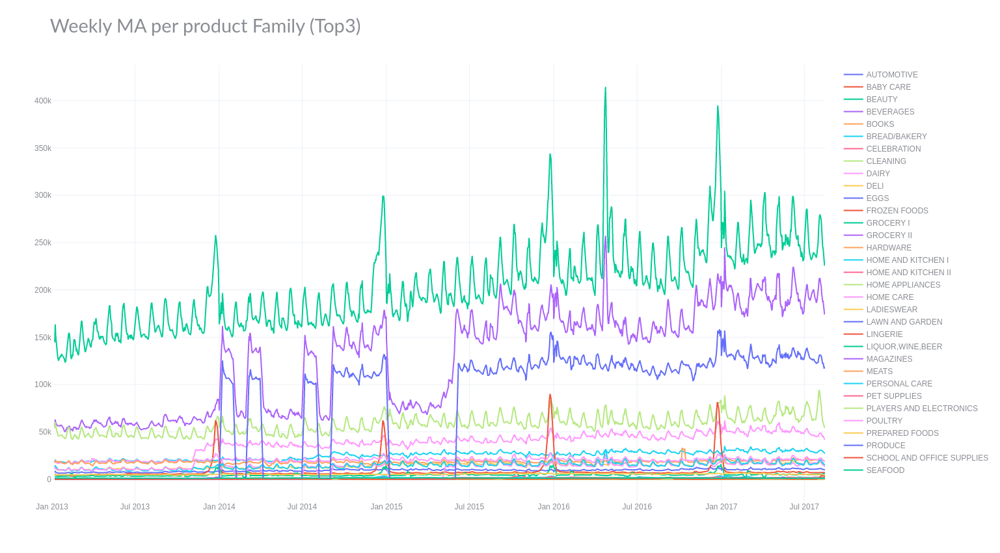

In [18]:
df = train.groupby(['date', 'family']).agg({"sales" : "sum"})
df = df.unstack(level=0).T.droplevel(level=0, axis=0).rolling(7).mean()
fig =  go.Figure()
for col in df.columns:
    fig.add_trace(go.Scatter(x=df.index, y=df[col], name=col, mode='lines'))
fig.update_layout(height=850,
                  title_text="Weekly MA per product Family (Top3)",
                  **plotly_base_params)
fig.show()

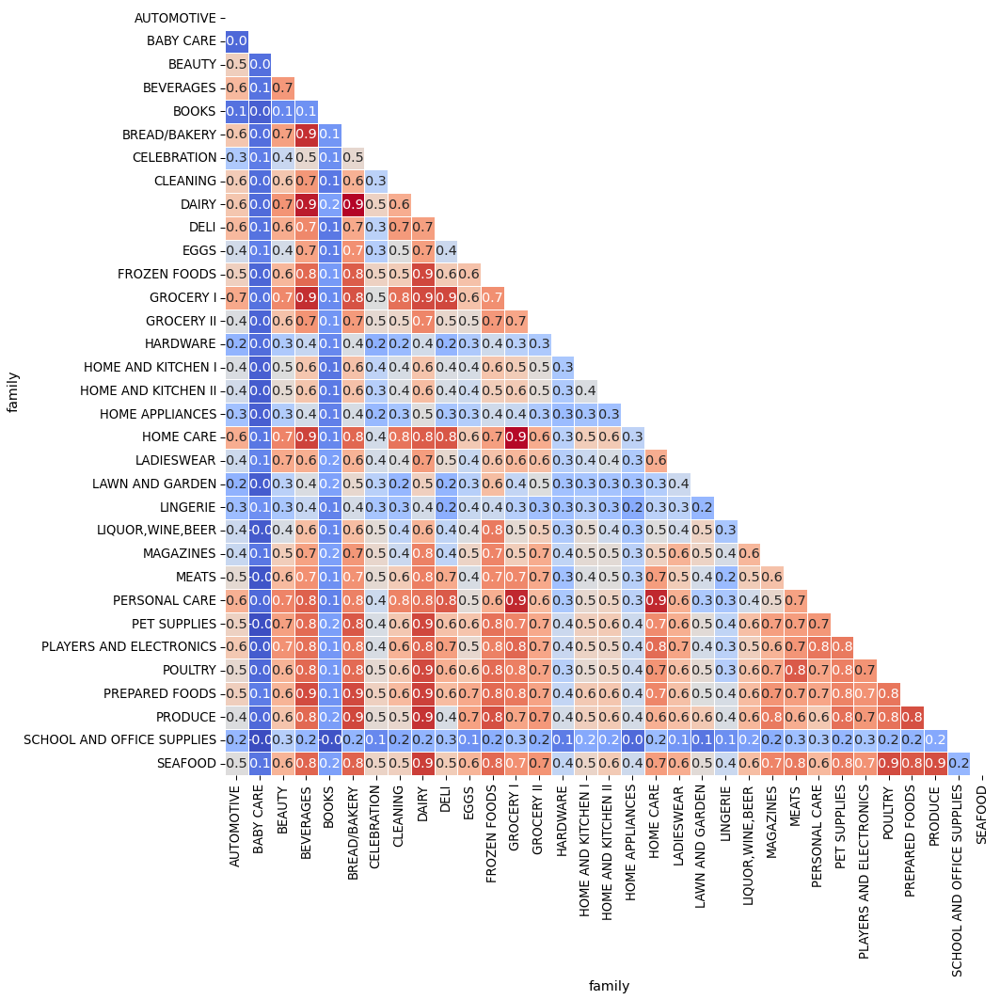

In [19]:
# Family-correlation
a = train_ext[train_ext["date"] >= "2017-04-30"]
a["ind"] = 1
a["ind"] = a.groupby("family").ind.cumsum().values
a = pd.pivot(a, index = "ind", columns = "family", values = "sales").corr(method="pearson")
mask = np.triu(a.corr(method="pearson"))

plt.figure(figsize=(15, 15))
sns.heatmap(a,
        annot=True,
        fmt='.1f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.tight_layout()

In [20]:
def plot_seasonal_decompose(result: DecomposeResult, title="Seasonal Decomposition"):
    return (
        make_subplots(rows=4, cols=1, subplot_titles=["Observed", "Trend", "Seasonal", "Residuals"])
        .add_trace(go.Scatter(x=result.seasonal.index, y=result.observed, mode="lines", name="Observed"),
                   row=1, col=1)
        .add_trace(go.Scatter(x=result.trend.index, y=result.trend, mode="lines", name="Trend"),
                   row=2, col=1)
        .add_trace(go.Scatter(x=result.seasonal.index, y=result.seasonal, mode="lines", name="Seasonal"),
                   row=3, col=1)
        .add_trace(go.Scatter(x=result.resid.index, y=result.resid, mode="lines", name="Residuals"),
                   row=4, col=1)
        .update_layout(template="plotly_white", height=1250, width=1000, title=title, margin=dict(t=100), title_x=0.5, showlegend=False)
    )

In [21]:
df_sales

,date,sales,sales_ma
0,2013-01-01,"2,511.6190",NaN
1,2013-01-02,"496,092.4179",NaN
2,2013-01-03,"361,461.2311",NaN
3,2013-01-04,"354,459.6771",NaN
4,2013-01-05,"477,350.1212",NaN
...,...,...,...
1679,2017-08-11,"826,373.7220","820,340.6337"
1680,2017-08-12,"792,630.5351","795,617.3315"
1681,2017-08-13,"865,639.6775","769,343.1191"
1682,2017-08-14,"760,922.4061","764,122.7537"


### Multiplicative vs. Additive:
* [Medium-article](https://sigmundojr.medium.com/seasonality-in-python-additive-or-multiplicative-model-d4b9cf1f48a7)

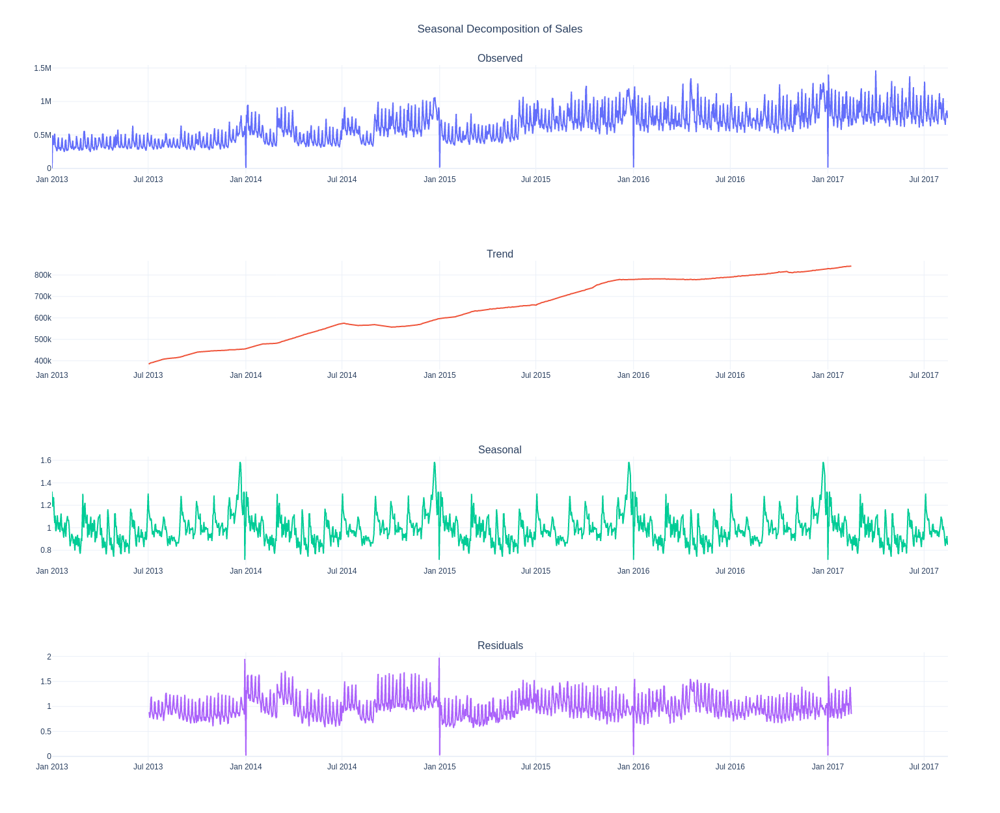

In [22]:
seasonnal = seasonal_decompose(df_sales.set_index('date')['sales'], model='multiplicative', period=365)
plot_seasonal_decompose(seasonnal, title="Seasonal Decomposition of Sales")

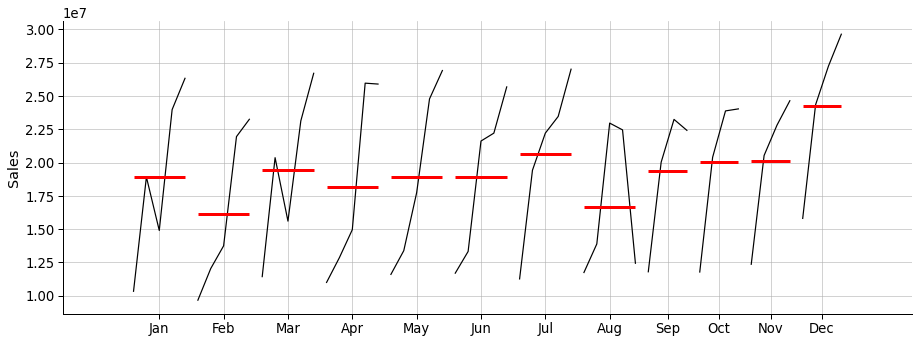

In [24]:
plotsize = (13, 5)
plt.rcParams['figure.figsize']= plotsize

month_df = df_sales.set_index(df_sales["date"]).resample("M").sum()

month_plot(month_df["sales"], ylabel= "Sales")
plt.grid(alpha= 0.7)
plt.tight_layout()

In [25]:
# compute 7-days moving average
oil['ma_oil'] = oil['dcoilwtico'].rolling(7).mean()
oil = oil.set_index('date')

# adding oil price to calendar
calendar['ma_oil'] = oil['ma_oil'].loc[train.date.min():test.date.max()]
calendar['ma_oil'].fillna(method='ffill', inplace=True)

oil

,dcoilwtico,ma_oil
date,,
2013-01-01,NaN,NaN
2013-01-02,93.1400,NaN
2013-01-03,92.9700,NaN
2013-01-04,93.1200,NaN
2013-01-07,93.2000,NaN
...,...,...
2017-08-25,47.6500,47.7200
2017-08-28,46.4000,47.6243
2017-08-29,46.4600,47.3200


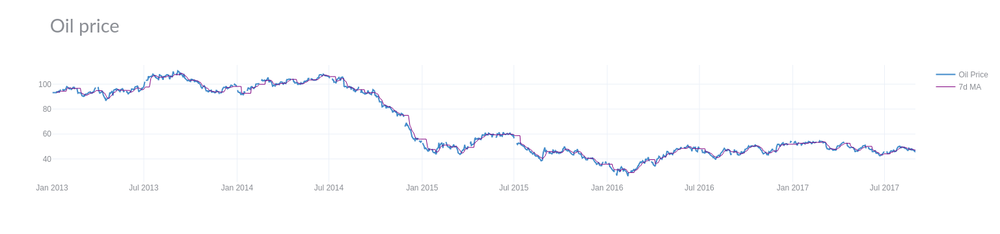

In [26]:
# chart
fig = go.Figure()
fig.add_scatter(x=oil.index, y=oil.dcoilwtico,
                mode='lines', name='Oil Price',
                line=dict(color='#428bca', width=2))

fig.add_scatter(x=oil.index, y=oil.ma_oil.fillna(method='ffill'),
                mode='lines', name='7d MA',
                line=dict(color='purple', width=1))

fig.update_layout(title='Oil price', **plotly_base_params)
fig.show()

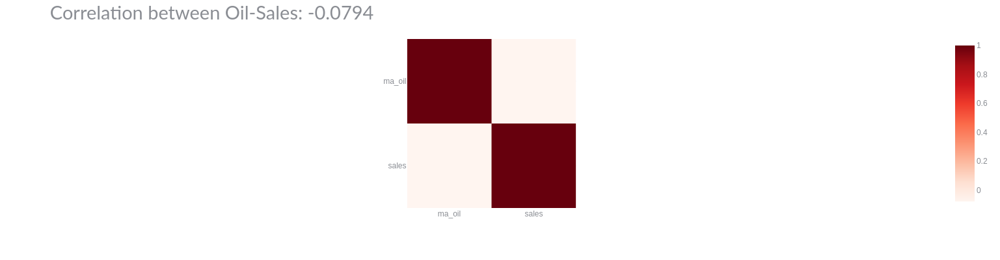

In [27]:
train_ext = train_ext.merge(oil, on='date', how='left')
input_corr_df = train_ext[['ma_oil', 'sales']].corr()
pearson_cor = input_corr_df.iloc[0]["sales"]


fig = px.imshow(input_corr_df, color_continuous_scale='reds')
fig.update_layout(title=f'Correlation between Oil-Sales: {pearson_cor: .4f}', height=400, width=700, **plotly_base_params)

In [28]:
print("Correlation between oil price and :")
for f in train_ext.family.unique():
    df = train_ext[train_ext.family == f][['sales', 'ma_oil']].copy()
    corr = df.corr().unstack().drop_duplicates().unstack()['ma_oil'].values[0]
    print(f" - {f}: {corr:.3f}")

Correlation between oil price and :
 - AUTOMOTIVE: -0.152
 - BABY CARE: -0.105
 - BEAUTY: -0.218
 - BEVERAGES: -0.358
 - BOOKS: -0.090
 - BREAD/BAKERY: -0.194
 - CELEBRATION: -0.312
 - CLEANING: -0.181
 - DAIRY: -0.240
 - DELI: -0.231
 - EGGS: -0.121
 - FROZEN FOODS: -0.089
 - GROCERY I: -0.216
 - GROCERY II: -0.063
 - HARDWARE: -0.085
 - HOME AND KITCHEN I: -0.313
 - HOME AND KITCHEN II: -0.394
 - HOME APPLIANCES: 0.028
 - HOME CARE: -0.500
 - LADIESWEAR: -0.286
 - LAWN AND GARDEN: -0.169
 - LINGERIE: 0.065
 - LIQUOR,WINE,BEER: -0.084
 - MAGAZINES: -0.390
 - MEATS: -0.029
 - PERSONAL CARE: -0.234
 - PET SUPPLIES: -0.332
 - PLAYERS AND ELECTRONICS: -0.358
 - POULTRY: -0.132
 - PREPARED FOODS: -0.085
 - PRODUCE: -0.348
 - SCHOOL AND OFFICE SUPPLIES: -0.096
 - SEAFOOD: -0.044


In [29]:
def make_lags(ts, lags):
    return pd.concat(
        {f'{ts.name}_lag_{i}': ts.shift(i) for i in range(1, lags + 1)},
        axis=1
    )

# add lagged oil features to calendar
oil_lags = make_lags(calendar['ma_oil'], 4).fillna(method='ffill')
calendar = calendar.join(oil_lags)
calendar

,weekday,ma_oil,ma_oil_lag_1,ma_oil_lag_2,ma_oil_lag_3,ma_oil_lag_4
2013-01-01,1,NaN,NaN,NaN,NaN,NaN
2013-01-02,2,NaN,NaN,NaN,NaN,NaN
2013-01-03,3,NaN,NaN,NaN,NaN,NaN
2013-01-04,4,NaN,NaN,NaN,NaN,NaN
2013-01-05,5,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
2017-08-27,6,47.7200,47.7200,47.7200,47.5986,47.6457
2017-08-28,0,47.6243,47.7200,47.7200,47.7200,47.5986
2017-08-29,1,47.3200,47.6243,47.7200,47.7200,47.7200
2017-08-30,2,47.1157,47.3200,47.6243,47.7200,47.7200


## Holidays and Events

In [30]:
mask = holidays_events.description=='Viernes Santo'
holidays_events[mask]

,date,type,locale,locale_name,description,transferred
51,2013-04-29,Holiday,National,Ecuador,Viernes Santo,False
99,2014-04-18,Holiday,National,Ecuador,Viernes Santo,False
166,2015-04-03,Holiday,National,Ecuador,Viernes Santo,False
215,2016-03-25,Holiday,National,Ecuador,Viernes Santo,False
306,2017-04-14,Holiday,National,Ecuador,Viernes Santo,False


In [31]:
# 'Good Friday' mistake correction
holidays_events['date'][mask].replace({'2013-04-29': pd.to_datetime('2013-03-29')}, inplace=True)
holidays_events = holidays_events.set_index('date').sort_index()
# keep National level only for simplicity
holidays_events = holidays_events[holidays_events.locale=='National']
# keep only one event per day
holidays_events = holidays_events.groupby(holidays_events.index).first()

In [32]:
holidays_events

,type,locale,locale_name,description,transferred
date,,,,,
2012-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,False
2012-10-09,Holiday,National,Ecuador,Independencia de Guayaquil,True
2012-10-12,Transfer,National,Ecuador,Traslado Independencia de Guayaquil,False
2012-11-02,Holiday,National,Ecuador,Dia de Difuntos,False
2012-11-03,Holiday,National,Ecuador,Independencia de Cuenca,False
...,...,...,...,...,...
2017-12-22,Additional,National,Ecuador,Navidad-3,False
2017-12-23,Additional,National,Ecuador,Navidad-2,False
2017-12-24,Additional,National,Ecuador,Navidad-1,False


In [33]:
# data
avg_sales = train.groupby('date').agg({"sales" : "mean"}).reset_index()
df_s_he = avg_sales.merge(holidays_events, on='date', how='left')
df_s_he = df_s_he.rename(columns={"type": "event_type"})
df_s_he

,date,sales,event_type,locale,locale_name,description,transferred
0,2013-01-01,1.4094,Holiday,National,Ecuador,Primer dia del ano,False
1,2013-01-02,278.3908,NaN,NaN,NaN,NaN,NaN
2,2013-01-03,202.8402,NaN,NaN,NaN,NaN,NaN
3,2013-01-04,198.9112,NaN,NaN,NaN,NaN,NaN
4,2013-01-05,267.8732,Work Day,National,Ecuador,Recupero puente Navidad,False
...,...,...,...,...,...,...,...
1679,2017-08-11,463.7339,Transfer,National,Ecuador,Traslado Primer Grito de Independencia,False
1680,2017-08-12,444.7983,NaN,NaN,NaN,NaN,NaN
1681,2017-08-13,485.7686,NaN,NaN,NaN,NaN,NaN
1682,2017-08-14,427.0047,NaN,NaN,NaN,NaN,NaN


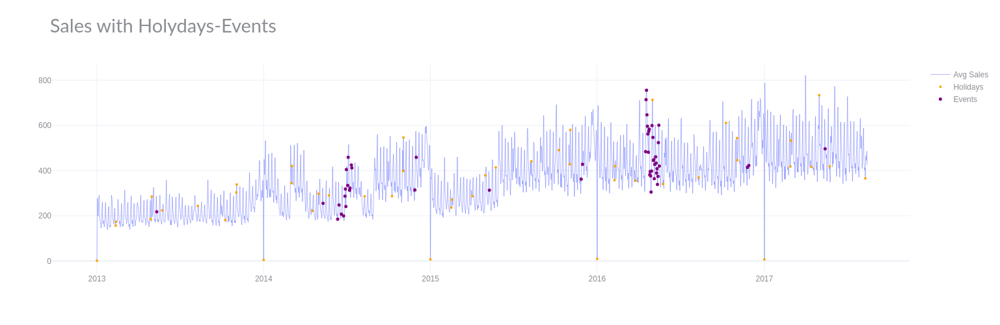

In [34]:
# chart
fig = go.Figure()

fig.add_scatter(x=df_s_he.date, y=df_s_he.sales,
                mode='lines', name='Avg Sales', line=dict(width=.5))

fig.add_scatter(x=df_s_he['date'][df_s_he.event_type=='Holiday'],
                y=df_s_he['sales'][df_s_he.event_type=='Holiday'],
                mode='markers', name='Holidays',
                marker=dict(color='orange', size=4))

fig.add_scatter(x=df_s_he['date'][df_s_he.event_type=='Event'],
                y=df_s_he['sales'][df_s_he.event_type=='Event'],
                mode='markers', name='Events',
                marker=dict(color='purple', size=5))

fig.update_layout(title='Sales with Holydays-Events',
                  height=500, width=1000, **plotly_base_params)
fig.show()

In [35]:
# correction of workdays using holidays/events dates

def compute_workdays(df, dofw_col):
    df['workday'] = True
    # exclude week-ends
    df.loc[df[dofw_col] > 4, 'workday'] = False
    # friday bridges are not working days
    df.loc[df.event_type=='Bridge', 'workday'] = False
    # some bridges are recovered by working at weekends
    df.loc[df.event_type=='Work Day', 'workday'] = True
    # handling Transfered events
    df.loc[df.event_type=='Transfer', 'workday'] = False
    df.loc[(df.event_type=='Holiday')&(df.transferred==False), 'workday'] = False
    df.loc[(df.event_type=='Holiday')&(df.transferred==True ), 'workday'] = True
    return df          

In [36]:
# holidays / events
calendar = calendar.merge(holidays_events, how='left', left_index=True, right_index=True)
calendar = calendar.rename(columns={"type": "event_type"})
# days of work
calendar = compute_workdays(calendar, 'weekday')
calendar['workday'] = calendar['workday'] * 1
calendar.drop(columns=['locale', 'locale_name', 'description', 'transferred'], inplace=True)

In [41]:
# df_sales.to_csv("../data/processed_dfs/df_sales.csv", index= False)

In [45]:
# holidays_events.to_csv("../data/processed_dfs/proc_holidays_events.csv", index= False)

In [37]:
from prophet import Prophet
from prophet.plot import add_changepoints_to_plot, plot_cross_validation_metric
from prophet.diagnostics import cross_validation, performance_metrics

In [46]:
df_sales

,date,sales,sales_ma
0,2013-01-01,"2,511.6190",NaN
1,2013-01-02,"496,092.4179",NaN
2,2013-01-03,"361,461.2311",NaN
3,2013-01-04,"354,459.6771",NaN
4,2013-01-05,"477,350.1212",NaN
...,...,...,...
1679,2017-08-11,"826,373.7220","820,340.6337"
1680,2017-08-12,"792,630.5351","795,617.3315"
1681,2017-08-13,"865,639.6775","769,343.1191"
1682,2017-08-14,"760,922.4061","764,122.7537"


In [94]:
df_input_prophet = df_sales.drop(columns= "sales_ma").rename(columns= {"date": "ds", "sales": "y"})
df_input_prophet

,ds,y
0,2013-01-01,"2,511.6190"
1,2013-01-02,"496,092.4179"
2,2013-01-03,"361,461.2311"
3,2013-01-04,"354,459.6771"
4,2013-01-05,"477,350.1212"
...,...,...
1679,2017-08-11,"826,373.7220"
1680,2017-08-12,"792,630.5351"
1681,2017-08-13,"865,639.6775"
1682,2017-08-14,"760,922.4061"


# Vanilla Prophet

In [95]:
m = Prophet()
m = m.fit(df_input_prophet)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -39.0776
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3507.48    0.00537189       279.757           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3509.32    0.00141051        77.501      0.2631           1      263   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3511.72    0.00326814       130.845       1.207      0.1207      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     339       3512.28   0.000171388       114.051   1.294e-06       0.001      471  LS failed, Hessian reset 
     398       3512.32   2.02469e-05       85.0941   2.537e-07       0.001      583  LS failed, Hessian reset 
     399       3512.32   7.69948e-06       68.3269      0.3383           1      585   
    Iter      log pro

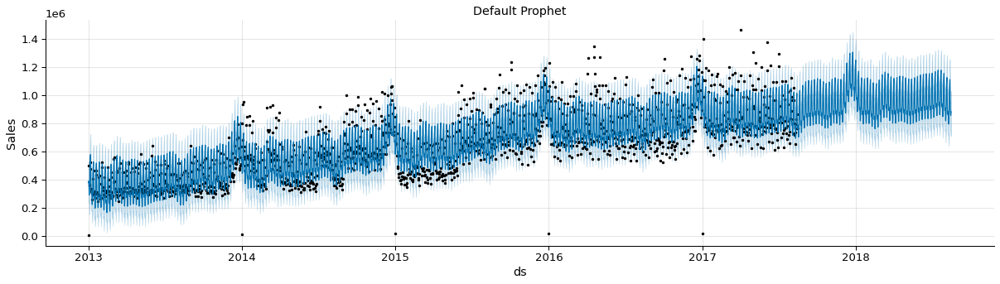

In [96]:
plotsize = (17, 5)

d_plot = m.plot(forecast, figsize= plotsize)
#plt.axhline(y=0, color='red')
#plt.axvline(x= pd.to_datetime(max(df['ds'])), color = 'red')
plt.title('Default Prophet')
plt.ylabel("Sales")
plt.tight_layout()

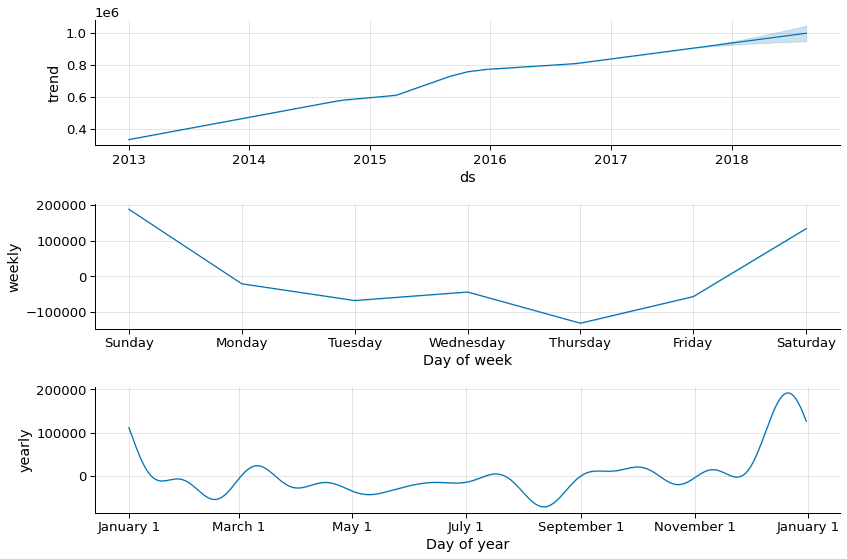

In [97]:
d_components = m.plot_components(forecast, figsize= (12, 8))
plt.tight_layout()

In [98]:
df_cv= cross_validation(m, horizon= '365 days', period= '180 days', initial= '730 days')

INFO:prophet:Making 4 forecasts with cutoffs between 2015-02-22 00:00:00 and 2016-08-15 00:00:00


  0%|          | 0/4 [00:00<?, ?it/s]

Initial log joint probability = -18.8357
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1504.08    0.00453537       104.454      0.7567     0.07567      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       1505.18    0.00114368       86.9642   1.182e-05       0.001      199  LS failed, Hessian reset 
     199       1505.69   1.79143e-05       83.0792      0.6759      0.6759      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     235        1505.7   1.63435e-05       80.6114    1.68e-07       0.001      384  LS failed, Hessian reset 
     253        1505.7   5.73052e-08       78.0392      0.2557           1      411   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -27.3094
    Iter      log prob        ||dx||      ||grad||   

In [99]:
metrics= performance_metrics(df_cv)
display(metrics[['horizon', 'mape', 'smape']])
print("Horizon of 365 days MAPE: {:.2%} and sMAPE: {:.4f}".format(metrics.iloc[metrics.shape[0]-1]['mape'], metrics.iloc[metrics.shape[0]-1]['smape']))

,horizon,mape,smape
0,37 days,0.1595,0.1445
1,38 days,0.1636,0.1480
2,39 days,0.1662,0.1504
3,40 days,0.1661,0.1504
4,41 days,0.1660,0.1504
...,...,...,...
324,361 days,0.2769,0.2675
325,362 days,0.2786,0.2699
326,363 days,0.2813,0.2726
327,364 days,0.2794,0.2718


Horizon of 365 days MAPE: 27.79% and sMAPE: 0.2707


# Prophet Multiplicative

In [100]:
m = Prophet(seasonality_mode= "multiplicative")
m = m.fit(df_input_prophet)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -39.0776
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3537.4     0.0150036        101.21           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3540.96     0.0191256       105.291           1           1      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       3542.43   0.000937757       280.569   7.546e-06       0.001      339  LS failed, Hessian reset 
     299       3542.98   0.000219846       73.6794           1           1      426   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     381       3543.32   0.000259234       78.2481   2.889e-06       0.001      583  LS failed, Hessian reset 
     399       3543.35   1.67116e-05       70.0758      0.7168      0.7168      604   
    Iter      log pro

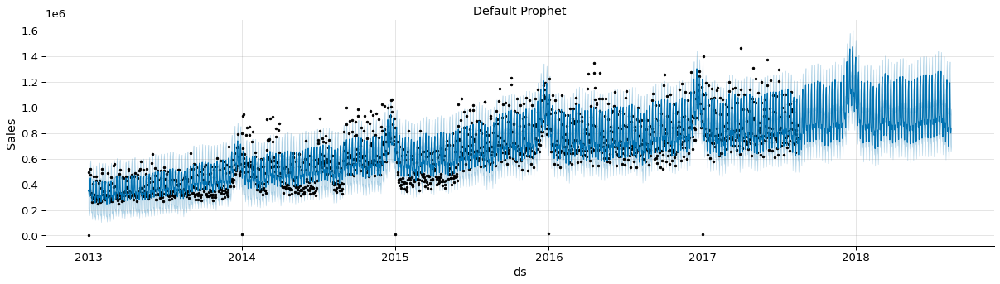

In [101]:
plotsize = (17, 5)

d_plot = m.plot(forecast, figsize= plotsize)
#plt.axhline(y=0, color='red')
#plt.axvline(x= pd.to_datetime(max(df['ds'])), color = 'red')
plt.title('Default Prophet')
plt.ylabel("Sales")
plt.tight_layout()

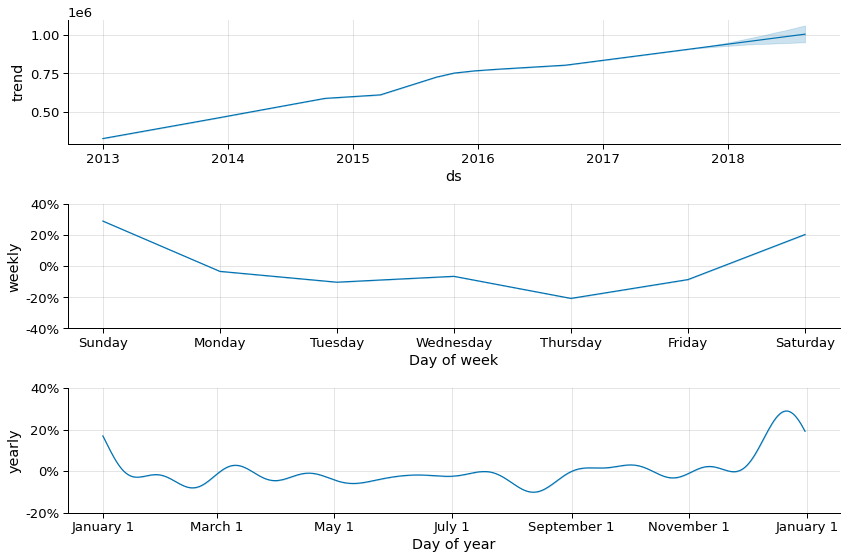

In [102]:
d_components = m.plot_components(forecast, figsize= (12, 8))
plt.tight_layout()

In [103]:
df_cv= cross_validation(m, horizon= '365 days', period= '180 days', initial= '730 days')

INFO:prophet:Making 4 forecasts with cutoffs between 2015-02-22 00:00:00 and 2016-08-15 00:00:00


  0%|          | 0/4 [00:00<?, ?it/s]

Initial log joint probability = -18.8357
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1549.08    0.00279554       79.5258      0.3038           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1550.96     0.0224516       110.054      0.5839           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1551.87    0.00119572       73.6805      0.7647      0.7647      379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     339       1552.02   0.000272395       85.3463   3.407e-06       0.001      479  LS failed, Hessian reset 
     399       1552.12   0.000699912       91.1576           1           1      547   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     429       1552.16   0.000111108    

In [104]:
metrics= performance_metrics(df_cv)
display(metrics[['horizon', 'mape', 'smape']])
print("Horizon of 365 days MAPE: {:.2%} and sMAPE: {:.4f}".format(metrics.iloc[metrics.shape[0]-1]['mape'], metrics.iloc[metrics.shape[0]-1]['smape']))

,horizon,mape,smape
0,37 days,0.1617,0.1461
1,38 days,0.1658,0.1495
2,39 days,0.1701,0.1535
3,40 days,0.1720,0.1552
4,41 days,0.1723,0.1555
...,...,...,...
324,361 days,0.2586,0.2755
325,362 days,0.2589,0.2767
326,363 days,0.2590,0.2773
327,364 days,0.2561,0.2754


Horizon of 365 days MAPE: 25.39% and sMAPE: 0.2735


# Prophet + Holidays

In [105]:
holiday_prophet = pd.DataFrame()

h_col1 = holidays_events[holidays_events["type"].isin(["Holiday", "Event"])]["type"].tolist()

holiday_prophet["holiday"] = h_col1
holiday_prophet["ds"] = holidays_events[holidays_events["type"].isin(["Holiday", "Event"])].index
holiday_prophet["lower_window"] = 0
holiday_prophet["upper_window"] = 1
holiday_prophet

,holiday,ds,lower_window,upper_window
0,Holiday,2012-08-10,0,1
1,Holiday,2012-10-09,0,1
2,Holiday,2012-11-02,0,1
3,Holiday,2012-11-03,0,1
4,Holiday,2012-12-25,0,1
...,...,...,...,...
108,Holiday,2017-08-10,0,1
109,Holiday,2017-10-09,0,1
110,Holiday,2017-11-02,0,1
111,Holiday,2017-11-03,0,1


In [106]:
m = Prophet(seasonality_mode= "multiplicative", holidays= holiday_prophet)
m = m.fit(df_input_prophet)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -39.0776
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3572.91    0.00941351       184.812           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3576.36   0.000668989       61.2157           1           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       3577.97   0.000184654       71.5556   9.567e-07       0.001      411  LS failed, Hessian reset 
     299       3578.23    0.00190925        101.89           1           1      425   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     349       3578.41     0.0001609        79.403    2.87e-06       0.001      534  LS failed, Hessian reset 
     399       3578.45   0.000461811       99.1739           1           1      593   
    Iter      log pro

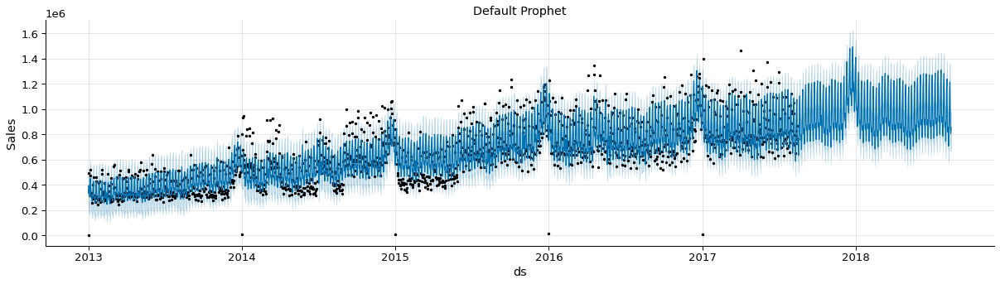

In [107]:
plotsize = (17, 5)

d_plot = m.plot(forecast, figsize= plotsize)
#plt.axhline(y=0, color='red')
#plt.axvline(x= pd.to_datetime(max(df['ds'])), color = 'red')
plt.title('Default Prophet')
plt.ylabel("Sales")
plt.tight_layout()

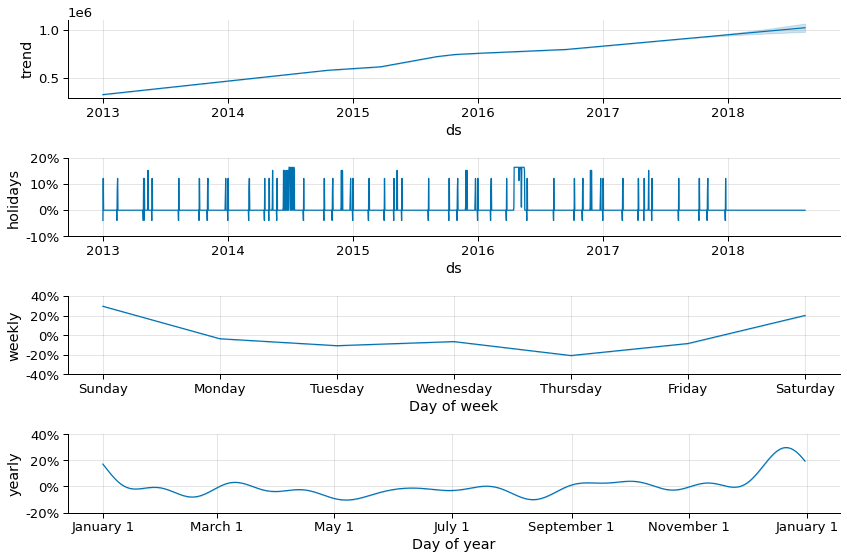

In [108]:
d_components = m.plot_components(forecast, figsize= (12, 8))
plt.tight_layout()

In [109]:
df_cv= cross_validation(m, horizon= '365 days', period= '180 days', initial= '730 days')

INFO:prophet:Making 4 forecasts with cutoffs between 2015-02-22 00:00:00 and 2016-08-15 00:00:00


  0%|          | 0/4 [00:00<?, ?it/s]

Initial log joint probability = -18.8357
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1565.3    0.00335671       103.791      0.3383           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1567.38    0.00224386       84.0253           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279       1568.09   0.000431491       92.2083   5.298e-06       0.001      383  LS failed, Hessian reset 
     299       1568.12   6.44001e-06       79.6355           1           1      409   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1568.15   5.49303e-05       76.5312           1           1      532   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     456       1568.17    1.9592e-08    

In [110]:
metrics= performance_metrics(df_cv)
display(metrics[['horizon', 'mape', 'smape']])
print("Horizon of 365 days MAPE: {:.2%} and sMAPE: {:.4f}".format(metrics.iloc[metrics.shape[0]-1]['mape'], metrics.iloc[metrics.shape[0]-1]['smape']))

,horizon,mape,smape
0,37 days,0.1591,0.1442
1,38 days,0.1640,0.1481
2,39 days,0.1685,0.1523
3,40 days,0.1712,0.1549
4,41 days,0.1723,0.1558
...,...,...,...
324,361 days,0.2740,0.2850
325,362 days,0.2739,0.2861
326,363 days,0.2737,0.2866
327,364 days,0.2705,0.2847


Horizon of 365 days MAPE: 26.92% and sMAPE: 0.2837


# Prophet + Holidays + Regressor + Oil Regressor

In [111]:
# creating an indicator variable for NFL sundays
def close_days(ds):
    """
    NFL season: August, September, October, November, December, January, February
    Sunday => 6 | range: 0-6 => Monday-Sunday
    """
    date = pd.to_datetime(ds)
    if date.month == 1 and date.day == 1:
        return 1
    else: 
        return 0

In [112]:
df_regressor = df_sales.copy()
df_regressor["year"] = df_sales["date"].dt.year
df_regressor.groupby("year").min()

,date,sales,sales_ma
year,,,
2013,2013-01-01,"2,511.6190","316,070.0482"
2014,2014-01-01,"8,602.0654","397,368.9389"
2015,2015-01-01,"12,773.6170","442,521.7961"
2016,2016-01-01,"16,433.3940","688,761.0808"
2017,2017-01-01,"12,082.5010","764,122.7537"


In [113]:
df_regressor["close_days"] = df_regressor["date"].apply(close_days)
df_regressor

,date,sales,sales_ma,year,close_days
0,2013-01-01,"2,511.6190",NaN,2013,1
1,2013-01-02,"496,092.4179",NaN,2013,0
2,2013-01-03,"361,461.2311",NaN,2013,0
3,2013-01-04,"354,459.6771",NaN,2013,0
4,2013-01-05,"477,350.1212",NaN,2013,0
...,...,...,...,...,...
1679,2017-08-11,"826,373.7220","820,340.6337",2017,0
1680,2017-08-12,"792,630.5351","795,617.3315",2017,0
1681,2017-08-13,"865,639.6775","769,343.1191",2017,0
1682,2017-08-14,"760,922.4061","764,122.7537",2017,0


In [114]:
df_regressor[df_regressor["close_days"] == 1]

df_regressor = df_regressor.drop(columns= ["sales_ma", "year"]).rename(columns= {"date": "ds", "sales": "y"})
df_regressor

,ds,y,close_days
0,2013-01-01,"2,511.6190",1
1,2013-01-02,"496,092.4179",0
2,2013-01-03,"361,461.2311",0
3,2013-01-04,"354,459.6771",0
4,2013-01-05,"477,350.1212",0
...,...,...,...
1679,2017-08-11,"826,373.7220",0
1680,2017-08-12,"792,630.5351",0
1681,2017-08-13,"865,639.6775",0
1682,2017-08-14,"760,922.4061",0


In [156]:
m = Prophet(seasonality_mode= "multiplicative", holidays= holiday_prophet)
m.add_regressor('close_days')
m = m.fit(df_regressor)

# Regressor must also be available in future df
future = m.make_future_dataframe(periods=365)
future['close_days'] = future['ds'].apply(close_days)
forecast = m.predict(future)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -39.0776
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3725.4    0.00837707       169.742      0.6964           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       3730.09   0.000223679       149.969   1.426e-06       0.001      246  LS failed, Hessian reset 
     199       3731.77    0.00201383       61.3758      0.4102      0.4102      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     288       3734.89    0.00513072       438.595   5.464e-05       0.001      426  LS failed, Hessian reset 
     299       3735.44     0.0034146       99.4472           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3736.33    0.00411979       156.326       6.118      0.6118      565   
    Iter      log pro

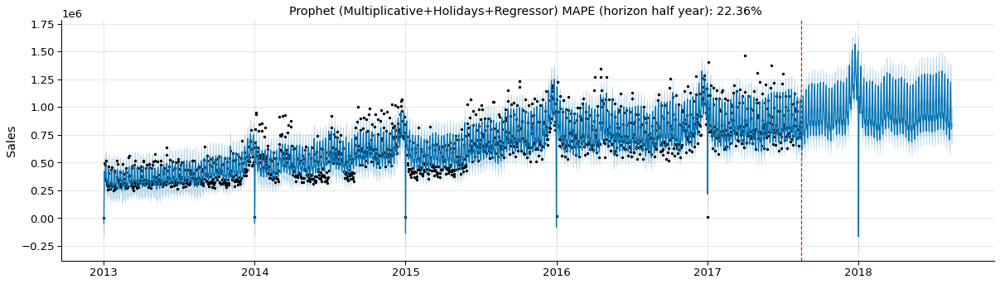

In [157]:
plotsize = (17, 5)

d_plot = m.plot(forecast, figsize= plotsize)
#plt.axhline(y=0, color='red')
#plt.axvline(x= pd.to_datetime(max(df['ds'])), color = 'red')
plt.title('Prophet (Multiplicative+Holidays+Regressor) MAPE (horizon half year): 22.36% ')
plt.axvline(x= pd.to_datetime(max(df_regressor['ds'])), color = 'red', linestyle= "dashed")
plt.ylabel("Sales")
plt.xlabel("")
plt.savefig("../plots/prophet_model/forecast_prophet.png")
plt.tight_layout()

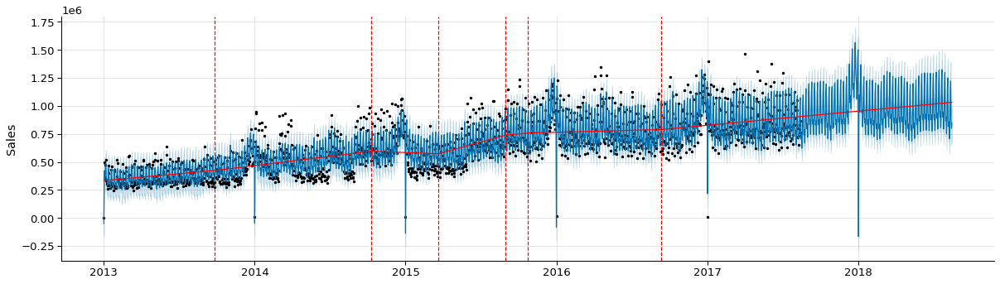

In [136]:
fig = m.plot(forecast, figsize= plotsize)
a = add_changepoints_to_plot(fig.gca(), m, forecast)
plt.ylabel("Sales")
plt.xlabel("")
# plt.savefig("../plots/prophet_model/forecast_prophet_change-points.png")
plt.tight_layout()

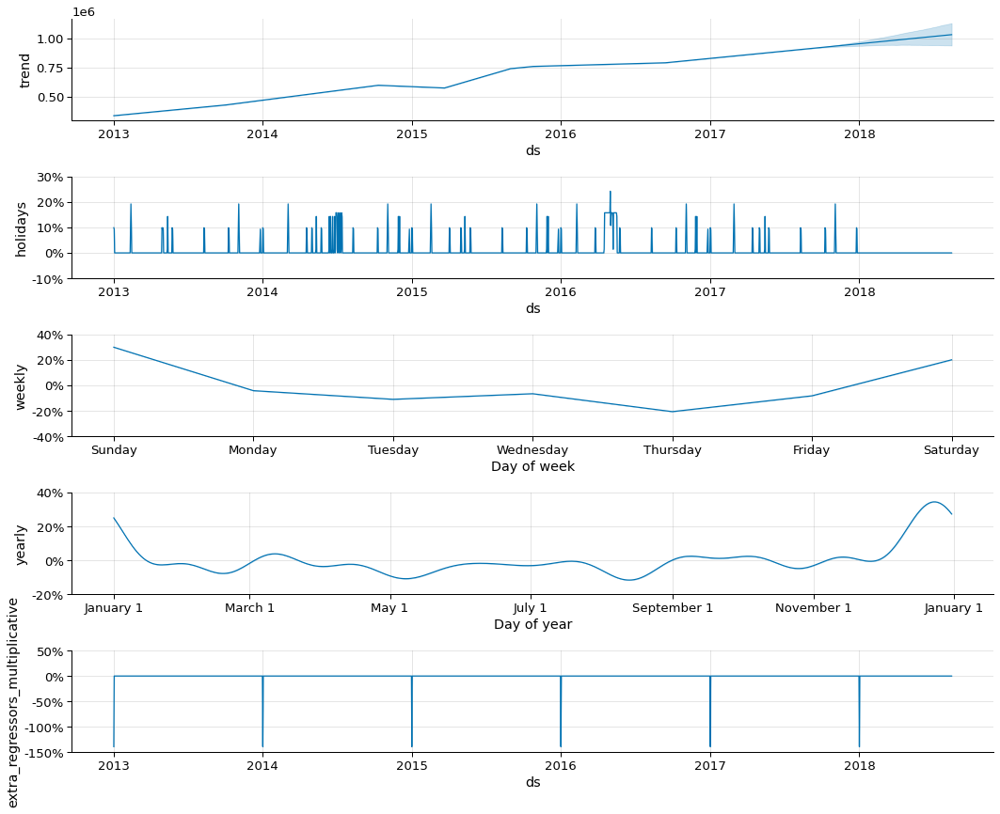

In [133]:
d_components = m.plot_components(forecast, figsize= (15, 12))
# plt.savefig("../plots/prophet_model/forecast_prophet-components.png")
plt.tight_layout()

In [134]:
df_cv= cross_validation(m, horizon= '365 days', period= '180 days', initial= '730 days')

INFO:prophet:Making 4 forecasts with cutoffs between 2015-02-22 00:00:00 and 2016-08-15 00:00:00


  0%|          | 0/4 [00:00<?, ?it/s]

Initial log joint probability = -18.8357
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1620.43     0.0031411       122.714      0.9596      0.9596      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187       1623.36   0.000440488       122.383   2.606e-06       0.001      265  LS failed, Hessian reset 
     199       1623.67   0.000316481       79.5509      0.4785      0.4785      279   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1624.26   0.000867294       61.5657           1           1      408   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     320       1624.58   0.000442362       124.882   2.659e-06       0.001      468  LS failed, Hessian reset 
     363        1624.9    6.6647e-05       63.2754   8.741e-07       0.001      548  LS failed, Hessian rese

In [120]:
metrics= performance_metrics(df_cv)
display(metrics[['horizon', 'mape', 'smape']])
print("Horizon of 365 days MAPE: {:.2%} and sMAPE: {:.4f}".format(metrics.iloc[metrics.shape[0]-1]['mape'], metrics.iloc[metrics.shape[0]-1]['smape']))

,horizon,mape,smape
0,37 days,0.1446,0.1333
1,38 days,0.1496,0.1375
2,39 days,0.1547,0.1422
3,40 days,0.1569,0.1442
4,41 days,0.1571,0.1443
...,...,...,...
324,361 days,0.3046,0.3345
325,362 days,0.3039,0.3354
326,363 days,0.3033,0.3359
327,364 days,0.2996,0.3338


Horizon of 365 days MAPE: 29.86% and sMAPE: 0.3333


MAPE in half year: 22.36%

In [145]:
metrics.head(150)

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,37 days,"11,719,116,154.0481","108,254.8667","92,842.2854",0.1446,0.1226,0.1333,0.5931
1,38 days,"12,529,529,871.7100","111,935.3826","96,032.7789",0.1496,0.1242,0.1375,0.5724
2,39 days,"13,229,916,995.3657","115,021.3763","99,467.0408",0.1547,0.1317,0.1422,0.5448
3,40 days,"13,594,083,529.1359","116,593.6685","101,367.6244",0.1569,0.1333,0.1442,0.5310
4,41 days,"13,758,259,028.8991","117,295.6053","101,941.0592",0.1571,0.1347,0.1443,0.5241
...,...,...,...,...,...,...,...,...
145,182 days,"45,099,446,949.1128","212,366.3037","163,057.3371",0.2236,0.1783,0.2519,0.4569
146,183 days,"44,906,897,660.6879","211,912.4764","161,735.7853",0.2221,0.1772,0.2516,0.4707
147,184 days,"44,698,688,555.4082","211,420.6436","160,505.6923",0.2203,0.1647,0.2511,0.4845
148,185 days,"45,018,494,234.7415","212,175.6212","160,977.1544",0.2209,0.1598,0.2525,0.4862


In [140]:
365/2

182.5

# Prophet + Holidays + Regressor + Oil Regressor

In [122]:
oil["ds"] = oil.index
oil_regressor = oil[["ds", "dcoilwtico"]]
oil_regressor = oil_regressor.rename(columns = {"dcoilwtico": "oil_price"}).reset_index(drop= True)
oil_regressor
# oil_regressor = oil_regressor.fillna(value= 0)

,ds,oil_price
0,2013-01-01,NaN
1,2013-01-02,93.1400
2,2013-01-03,92.9700
3,2013-01-04,93.1200
4,2013-01-07,93.2000
...,...,...
1213,2017-08-25,47.6500
1214,2017-08-28,46.4000
1215,2017-08-29,46.4600
1216,2017-08-30,45.9600


In [123]:
df_regressor_oil = pd.merge(left= df_regressor, right= oil_regressor, on= "ds", how= "left").fillna(value= 0)
df_regressor_oil

,ds,y,close_days,oil_price
0,2013-01-01,"2,511.6190",1,0.0000
1,2013-01-02,"496,092.4179",0,93.1400
2,2013-01-03,"361,461.2311",0,92.9700
3,2013-01-04,"354,459.6771",0,93.1200
4,2013-01-05,"477,350.1212",0,0.0000
...,...,...,...,...
1679,2017-08-11,"826,373.7220",0,48.8100
1680,2017-08-12,"792,630.5351",0,0.0000
1681,2017-08-13,"865,639.6775",0,0.0000
1682,2017-08-14,"760,922.4061",0,47.5900


In [124]:
m = Prophet(seasonality_mode= "multiplicative", holidays= holiday_prophet)
m.add_regressor('close_days')
m.add_regressor('oil_price')
m = m.fit(df_regressor_oil)

# Regressor must also be available in future df
future = m.make_future_dataframe(periods=365)
future['close_days'] = future['ds'].apply(close_days)

forecast = m.predict(future)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -39.0776
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3726.32    0.00685021       139.902           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       3731.21   0.000167111       89.1758   8.388e-07       0.001      280  LS failed, Hessian reset 
     199       3733.49    0.00208898       70.3946           1           1      317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       3733.85   0.000908059       299.142   9.343e-06       0.001      370  LS failed, Hessian reset 
     299       3737.69    0.00122677       71.3486      0.7812      0.7812      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3738.61   2.16007e-06       64.2983      0.1876      0.1876      587   
    Iter      log pro

ValueError: Regressor 'oil_price' missing from dataframe

# Prophet + Holidays + Regressor + Normalization

In [ ]:
#df_norm = df_sales.drop(columns= "sales").rename(columns= {"date": "ds", "sales_ma": "y"})
#df_norm = df_norm[df_norm["y"].notnull()].reset_index(drop= True)
#df_norm

In [146]:
df_norm = pd.DataFrame()

df_norm["ds"] = df_sales["date"]
df_norm["y"] = np.log1p(df_sales["sales"]) 
df_norm["close_days"] = df_norm["ds"].apply(close_days)
df_norm

,ds,y,close_days
0,2013-01-01,7.8291,1
1,2013-01-02,13.1145,0
2,2013-01-03,12.7979,0
3,2013-01-04,12.7784,0
4,2013-01-05,13.0760,0
...,...,...,...
1679,2017-08-11,13.6248,0
1680,2017-08-12,13.5831,0
1681,2017-08-13,13.6712,0
1682,2017-08-14,13.5423,0


In [158]:
m = Prophet(seasonality_mode= "multiplicative", holidays= holiday_prophet)
m.add_regressor('close_days')
m = m.fit(df_norm)

# Regressor must also be available in future df
future = m.make_future_dataframe(periods=365)
future['close_days'] = future['ds'].apply(close_days)
forecast = m.predict(future)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -38.4724
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        6844.8    0.00209685       8398.62           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6909.33    0.00239017       2319.44           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6992.37   0.000192525       648.766           1           1      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7011.58    0.00117008       189.039           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       7016.86   0.000675918       1827.92      0.1844           1      586   
    Iter      log prob        ||dx||      ||grad||       alpha  

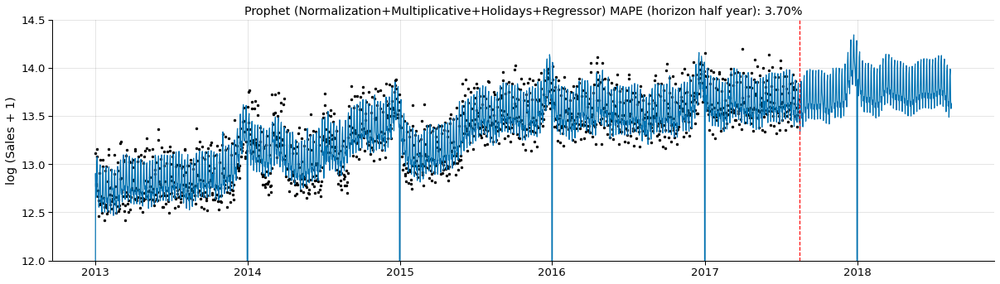

In [161]:
plotsize = (17, 5)

d_plot = m.plot(forecast, uncertainty= False, figsize= plotsize)
#plt.axhline(y=0, color='red')
#plt.axvline(x= pd.to_datetime(max(df['ds'])), color = 'red')
plt.axvline(x= pd.to_datetime(max(df_norm['ds'])), color = 'red', linestyle= "dashed")
plt.title('Prophet (Normalization+Multiplicative+Holidays+Regressor) MAPE (horizon half year): 3.70%')
plt.ylim(12,14.5)
plt.xlabel("")
plt.ylabel("log (Sales + 1)")
plt.savefig("../plots/prophet_model/prophet-model-norm.png")
plt.tight_layout()

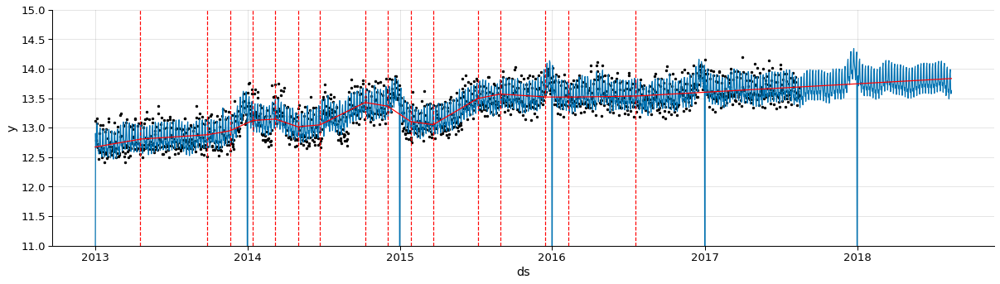

In [149]:
fig = m.plot(forecast, uncertainty= False, figsize= plotsize)
a = add_changepoints_to_plot(fig.gca(), m, forecast)
plt.ylim(11,15)
plt.tight_layout()

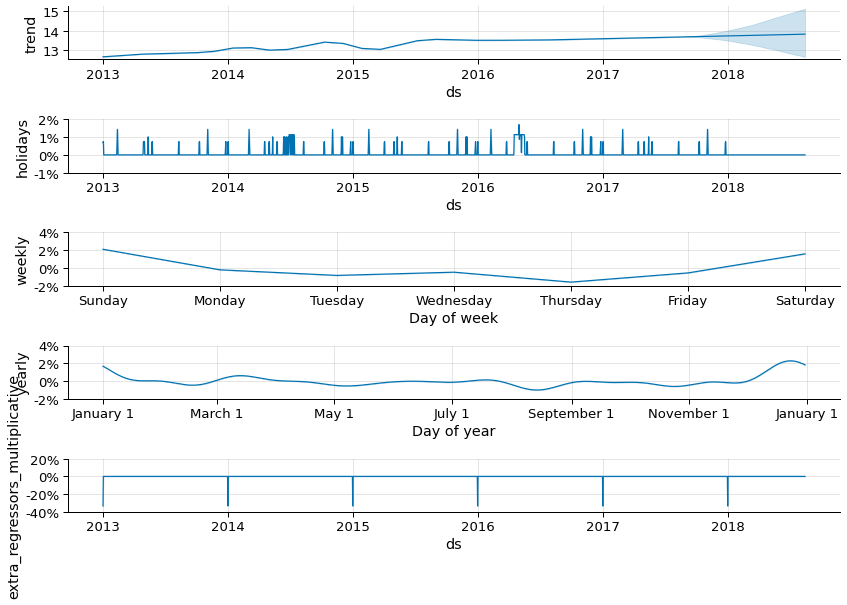

In [150]:
d_components = m.plot_components(forecast, figsize= (12, 8))
plt.tight_layout()

In [151]:
df_cv= cross_validation(m, horizon= '365 days', period= '180 days', initial= '730 days')

INFO:prophet:Making 4 forecasts with cutoffs between 2015-02-22 00:00:00 and 2016-08-15 00:00:00


  0%|          | 0/4 [00:00<?, ?it/s]

Initial log joint probability = -17.9214
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3156.16    0.00270019        1819.5           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3182.21    0.00327284        1325.9           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3187.24   0.000317984       391.992      0.3043      0.3043      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3190.32   8.32087e-05       208.711           1           1      467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3192.95    0.00172228       237.864           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha  

In [152]:
metrics= performance_metrics(df_cv)
display(metrics[['horizon', 'mape', 'smape']])
print("Horizon of 365 days MAPE: {:.2%} and sMAPE: {:.4f}".format(metrics.iloc[metrics.shape[0]-1]['mape'], metrics.iloc[metrics.shape[0]-1]['smape']))

,horizon,mape,smape
0,37 days,0.0080,0.0080
1,38 days,0.0084,0.0084
2,39 days,0.0088,0.0088
3,40 days,0.0091,0.0090
4,41 days,0.0091,0.0090
...,...,...,...
324,361 days,0.0368,0.0363
325,362 days,0.0368,0.0363
326,363 days,0.0368,0.0363
327,364 days,0.0368,0.0363


Horizon of 365 days MAPE: 3.70% and sMAPE: 0.0365
